In [1]:
!export LD_PRELOAD=/usr/lib/aarch64-linux-gnu/libgomp.so.1

In [2]:
import pandas as pd
import numpy as np
import pathlib
import os
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, mean_squared_error
import seaborn as sn
import tensorflow as tf


In [3]:
data_path = '/tf/Berkeley/W210/dementia/0extra/ADReSS-IS2020-data 2/train'
audio_path_cc = data_path + '/Full_wave_enhanced_audio/cc/'
audio_path_cd = data_path + '/Full_wave_enhanced_audio/cd/'

In [4]:
meta_cc = pd.read_csv(data_path + '/cc_meta_data.txt', sep=";", header=0, 
                      names = ['ID', 'Age', 'Gender', 'MMSE'])
meta_cd = pd.read_csv(data_path + '/cd_meta_data.txt', sep=";", header=0, 
                      names = ['ID', 'Age', 'Gender', 'MMSE'])

meta = meta_cc.assign(Group = 'cc').append(meta_cd.assign(Group = 'cd')).reset_index()

meta.MMSE = pd.to_numeric(meta.MMSE.replace(' NA', 30))

meta

,index,ID,Age,Gender,MMSE,Group
0,0,S001,74,male,30,cc
1,1,S002,62,female,30,cc
2,2,S003,69,female,29,cc
3,3,S004,71,female,30,cc
4,4,S005,74,female,30,cc
...,...,...,...,...,...,...
103,49,S150,58,male,20,cd
104,50,S151,72,male,24,cd
105,51,S153,68,female,12,cd
106,52,S154,65,female,20,cd


# Demo
The idea is that we could concatenate the chunk files together so that the audio will be free of voices of the nurses.

In [5]:
audio_chunk_path = '/tf/Berkeley/W210/dementia/0extra/ADReSS-IS2020-data 2/train/Normalised_audio-chunks/'
chunk_names = tf.io.gfile.glob(str(audio_chunk_path) + '*/*')
ID_list = list(map(lambda chunk_names:chunk_names.split('/')[-1].split('-')[0], chunk_names))

In [6]:
import wave 
ID_chunks = tf.gather(chunk_names, tf.where(tf.equal(ID_list, 'S043')))
ID_chunks = tf.squeeze(ID_chunks, axis = -1)
outfile = "concat.wav"

data= []
for infile in ID_chunks:
    w = wave.open(infile.numpy().decode("utf-8") , 'rb')
    data.append( [w.getparams(), w.readframes(w.getnframes())] )
    w.close()
    
output = wave.open(outfile, 'wb')
output.setparams(data[0][0])
for i in range(len(data)):
    output.writeframes(data[i][1])
output.close()

In [7]:
import IPython.display as ipd
ipd.Audio('concat.wav') 

In [8]:
ipd.Audio('/tf/Berkeley/W210/dementia/0extra/ADReSS-IS2020-data 2/train/Full_wave_enhanced_audio/cc/S043.wav') 

# Model

In [9]:

from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras import layers
from tensorflow.keras import models
seed = 30
tf.random.set_seed(seed)
np.random.seed(seed)

In [10]:
data_dir = pathlib.Path('/tf/Berkeley/W210/dementia/0extra/ADReSS-IS2020-data 2/train/Full_wave_enhanced_audio/')
filenames = tf.random.shuffle(tf.io.gfile.glob(str(data_dir) + '/*/*'))

train_cutoff = int(len(filenames)*0.7)
val_cutoff = int(len(filenames)*0.85)

train_files = filenames[:train_cutoff]
val_files = filenames[train_cutoff:val_cutoff]
test_files = filenames[val_cutoff:]

In [11]:
def decode_audio(path):
    audio_binary = tf.io.read_file(path)
    audio, _ = tf.audio.decode_wav(audio_binary)
    return audio

In [12]:
def get_data(file_path):

    names = meta.ID
    name = tf.strings.split(tf.strings.split(file_path, os.path.sep)[-1], '.')[0] 
    label = tf.gather(meta.MMSE, tf.where(tf.equal(names, name+ ' '))[0][0])
    
    ID_chunks = tf.gather(chunk_names, tf.where(tf.equal(ID_list, name)))
    ID_chunks = tf.squeeze(ID_chunks, axis = -1)
    audio_binary = tf.io.read_file(ID_chunks[0])
    audio, _ = tf.audio.decode_wav(audio_binary)
    
    ds = tf.data.Dataset.from_tensor_slices(ID_chunks[1:])

    for count, chunk_path in ds.enumerate():
        audio_binary = tf.io.read_file(chunk_path)
        x, _ = tf.audio.decode_wav(audio_binary)
        audio = tf.concat([audio, x], 0)
    
    waveform = tf.squeeze(audio, axis=-1)
    
    zero_padding = tf.zeros([10000000] - tf.shape(waveform), dtype=tf.float32)
    waveform = tf.cast(waveform, tf.float32)
    equal_length = tf.concat([waveform, zero_padding], 0)
    
    spectrogram = tf.signal.stft(equal_length, frame_length=255, frame_step=128)
    spectrogram = tf.abs(spectrogram)
    spectrogram = tf.expand_dims(spectrogram, -1)
    return spectrogram, label

In [13]:
AUTOTUNE = tf.data.AUTOTUNE

def preprocess_dataset(files):
    files_ds = tf.data.Dataset.from_tensor_slices(files)
    output_ds = files_ds.map(get_data, num_parallel_calls=AUTOTUNE)
    return output_ds


In [14]:
train_ds = preprocess_dataset(train_files)
val_ds = preprocess_dataset(val_files)
test_ds = preprocess_dataset(test_files)

In [15]:
for spectrogram, x in train_ds.take(1):
    input_shape = spectrogram.shape
    print(input_shape)
    print(x)

(78124, 129, 1)
tf.Tensor(19, shape=(), dtype=int64)


In [16]:
batch_size = 64
train_ds = train_ds.batch(batch_size)
val_ds = val_ds.batch(batch_size)

In [17]:
train_ds = train_ds.cache().prefetch(AUTOTUNE)
val_ds = val_ds.cache().prefetch(AUTOTUNE)

In [18]:
print('Input shape:', input_shape)

norm_layer = preprocessing.Normalization()
norm_layer.adapt(train_ds.map(lambda x, _: x))

model = models.Sequential([
    layers.Input(shape=input_shape),
    preprocessing.Resizing(32, 32), 
    norm_layer,
    layers.Conv2D(16, 3, activation='relu'),
#     layers.Conv2D(64, 3, activation='relu'),
    layers.MaxPooling2D(),
    layers.Dropout(0.25),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(1)
])

model.summary()

Input shape: (78124, 129, 1)
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resizing (Resizing)          (None, 32, 32, 1)         0         
_________________________________________________________________
normalization (Normalization (None, 32, 32, 1)         3         
_________________________________________________________________
conv2d (Conv2D)              (None, 30, 30, 16)        160       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
dropout (Dropout)            (None, 15, 15, 16)        0         
_________________________________________________________________
flatten (Flatten)            (None, 3600)              0         
_________________________________________________________________
dense (Dense)              

In [19]:
model.compile(
    optimizer="adam",
    loss='mse',
    metrics='mse'
)

In [20]:
EPOCHS = 100
history = model.fit(
    train_ds, 
    validation_data=val_ds,  
    epochs=EPOCHS
)

Epoch 1/100
2/2 [==============================] - 5s 4s/step - loss: 602.1175 - mse: 602.1175 - val_loss: 594.8749 - val_mse: 594.8749
Epoch 2/100
2/2 [==============================] - 0s 85ms/step - loss: 547.6819 - mse: 547.6819 - val_loss: 544.2095 - val_mse: 544.2095
Epoch 3/100
2/2 [==============================] - 0s 88ms/step - loss: 489.6069 - mse: 489.6069 - val_loss: 492.6231 - val_mse: 492.6231
Epoch 4/100
2/2 [==============================] - 0s 94ms/step - loss: 442.0553 - mse: 442.0553 - val_loss: 436.6415 - val_mse: 436.6415
Epoch 5/100
2/2 [==============================] - 0s 84ms/step - loss: 392.1992 - mse: 392.1992 - val_loss: 375.0195 - val_mse: 375.0195
Epoch 6/100
2/2 [==============================] - 0s 82ms/step - loss: 326.6488 - mse: 326.6488 - val_loss: 309.6281 - val_mse: 309.6281
Epoch 7/100
2/2 [==============================] - 0s 80ms/step - loss: 285.7002 - mse: 285.7002 - val_loss: 243.3622 - val_mse: 243.3622
Epoch 8/100
2/2 [===================

2/2 [==============================] - 0s 87ms/step - loss: 64.6454 - mse: 64.6454 - val_loss: 44.0834 - val_mse: 44.0834
Epoch 62/100
2/2 [==============================] - 0s 94ms/step - loss: 49.0511 - mse: 49.0511 - val_loss: 44.2347 - val_mse: 44.2347
Epoch 63/100
2/2 [==============================] - 0s 79ms/step - loss: 61.7825 - mse: 61.7825 - val_loss: 44.3717 - val_mse: 44.3717
Epoch 64/100
2/2 [==============================] - 0s 84ms/step - loss: 60.1323 - mse: 60.1323 - val_loss: 43.9735 - val_mse: 43.9735
Epoch 65/100
2/2 [==============================] - 0s 80ms/step - loss: 60.7566 - mse: 60.7566 - val_loss: 43.6263 - val_mse: 43.6263
Epoch 66/100
2/2 [==============================] - 0s 77ms/step - loss: 67.4309 - mse: 67.4309 - val_loss: 43.2001 - val_mse: 43.2001
Epoch 67/100
2/2 [==============================] - 0s 84ms/step - loss: 56.8081 - mse: 56.8081 - val_loss: 42.9665 - val_mse: 42.9665
Epoch 68/100
2/2 [==============================] - 0s 91ms/step - l

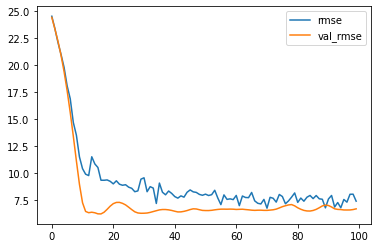

In [21]:
metrics = history.history
plt.plot(history.epoch, np.sqrt(metrics['mse']), np.sqrt(metrics['val_mse']))
plt.legend(['rmse', 'val_rmse'])
plt.show()

In [22]:
loss, mse = model.evaluate(test_ds.batch(1), verbose=2)
print('Restored model, accuracy: {:5.2f}'.format(np.sqrt(mse)))

17/17 - 3s - loss: 44.2655 - mse: 44.2655
Restored model, accuracy:  6.65


In [23]:
meta = meta.assign(split = '', predict = -99.99, predict_group = 'cc')


In [24]:
for file in train_files:
    ID = file.numpy().decode('utf-8').split('/')[-1].split('.')[0]
    predict = model.predict(preprocess_dataset([file]).batch(1), verbose=0)
    meta.at[np.where(meta.ID == (ID + ' '))[0][0], 'predict'] = predict
    meta.at[np.where(meta.ID == (ID + ' '))[0][0], 'split'] = 'train'
    if (predict < 24):
        meta.at[np.where(meta.ID == (ID + ' '))[0][0], 'predict_group'] = 'cd'

In [25]:
for file in test_files:
    ID = file.numpy().decode('utf-8').split('/')[-1].split('.')[0]
    predict = model.predict(preprocess_dataset([file]).batch(1), verbose=0)
    meta.at[np.where(meta.ID == (ID + ' '))[0][0], 'predict'] = predict
    meta.at[np.where(meta.ID == (ID + ' '))[0][0], 'split'] = 'test'
    if (predict < 24):
        meta.at[np.where(meta.ID == (ID + ' '))[0][0], 'predict_group'] = 'cd'

In [26]:
for file in val_files:
    ID = file.numpy().decode('utf-8').split('/')[-1].split('.')[0]
    predict = model.predict(preprocess_dataset([file]).batch(1), verbose=0)
    meta.at[np.where(meta.ID == (ID + ' '))[0][0], 'predict'] = predict
    meta.at[np.where(meta.ID == (ID + ' '))[0][0], 'split'] = 'val'
    if (predict < 24):
        meta.at[np.where(meta.ID == (ID + ' '))[0][0], 'predict_group'] = 'cd'

In [27]:
def cal_rmse(g):
    rmse = np.sqrt(mean_squared_error(g['MMSE'], g['predict'] ) )
    return pd.Series(dict(rmse = rmse ))

meta.groupby('split').apply(cal_rmse).reset_index()

,split,rmse
0,test,6.653229
1,train,6.445672
2,val,6.695422


In [28]:
meta.groupby('Gender').apply(cal_rmse).reset_index()

,Gender,rmse
0,female,6.746193
1,male,6.216755


<AxesSubplot:xlabel='Predicted', ylabel='Actual'>

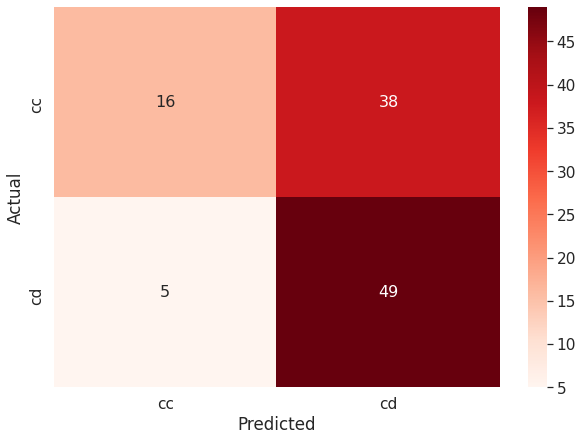

In [29]:
y_true = meta.Group
y_pred = meta.predict_group
data = confusion_matrix(y_true, y_pred)
df_cm = pd.DataFrame(data, columns=np.unique(y_true), index = np.unique(y_true))
df_cm.index.name = 'Actual'
df_cm.columns.name = 'Predicted'
plt.figure(figsize = (10,7))
sn.set(font_scale=1.4)#for label size
sn.heatmap(df_cm, cmap="Reds", annot=True,annot_kws={"size": 16})# font size